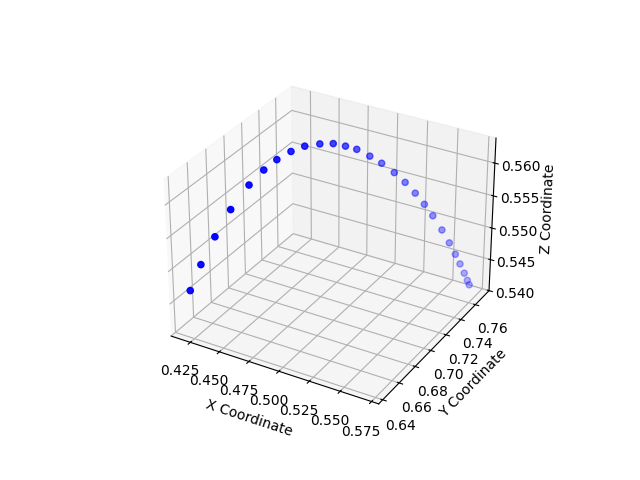

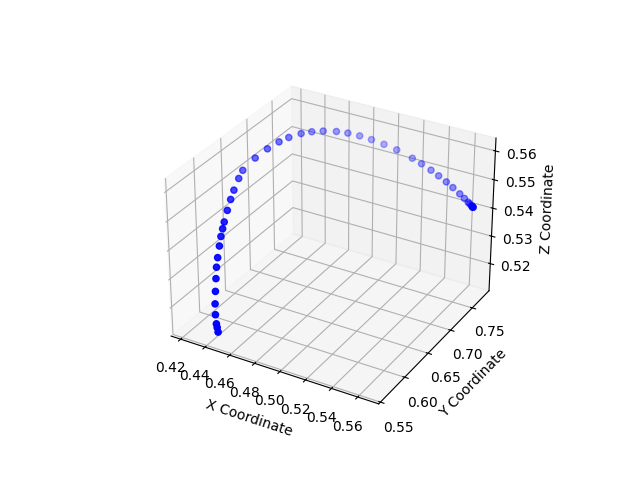

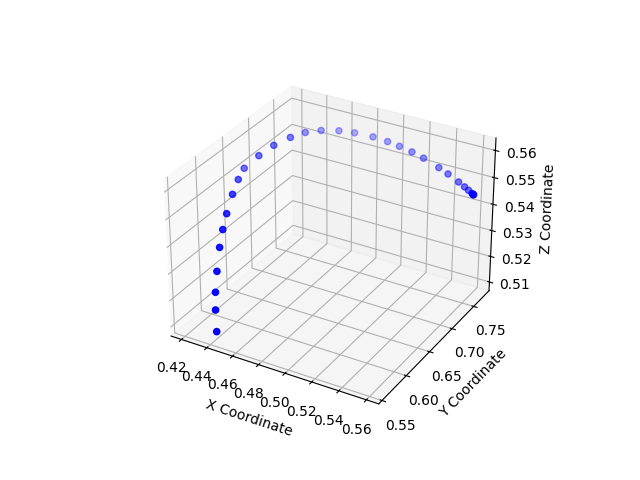

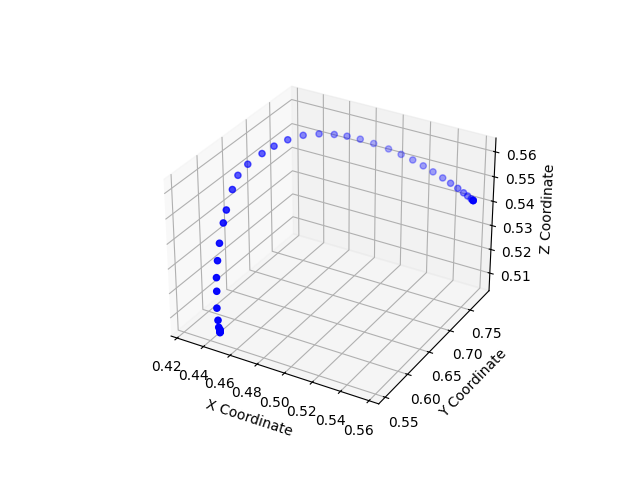

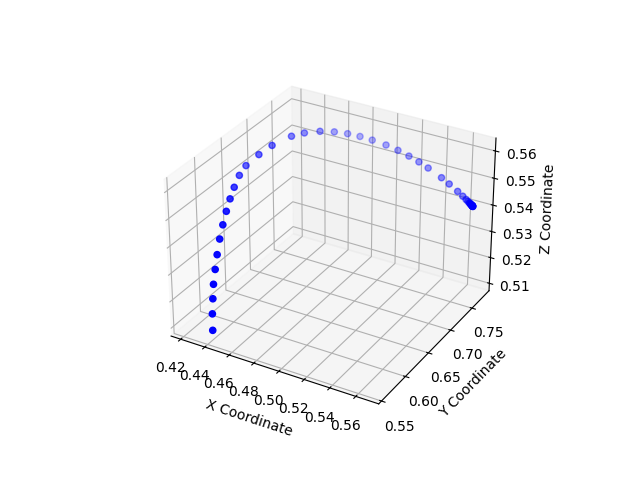

...

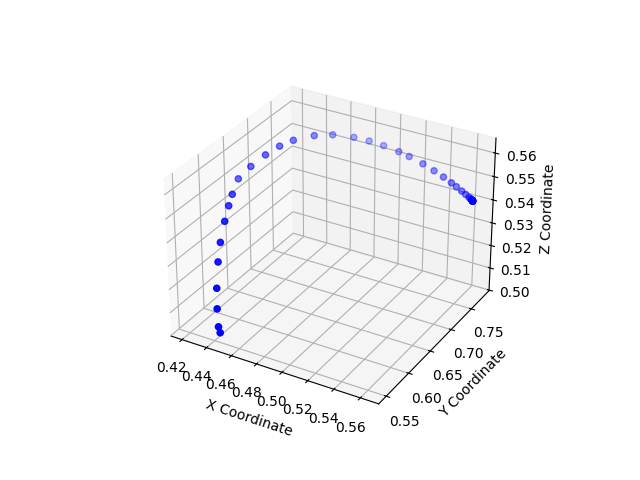

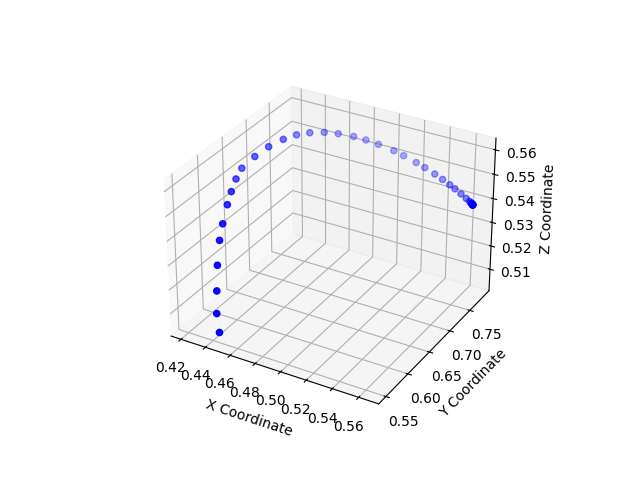

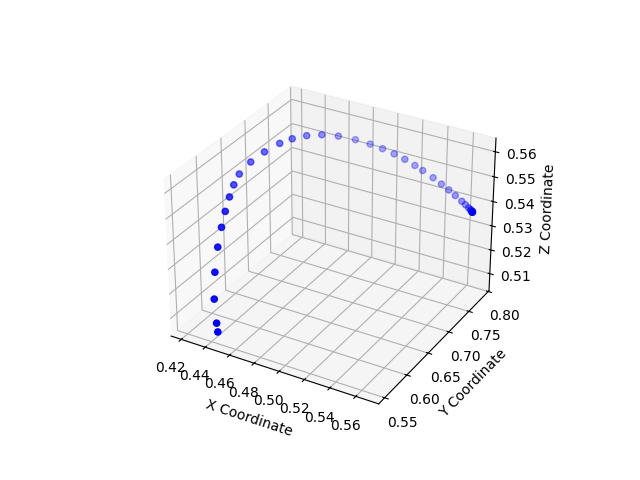

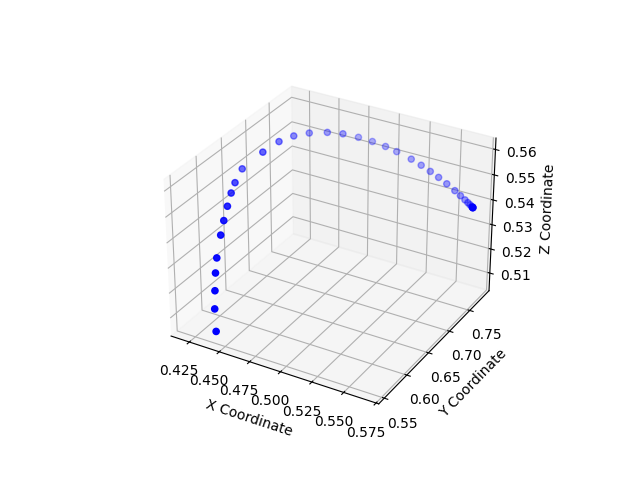

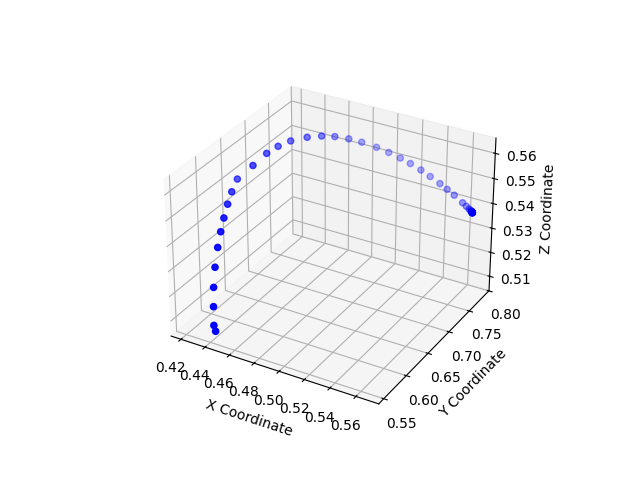

/tmp/ipykernel_464415/2343299417.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(f"Uninjured: {sheet_name}")


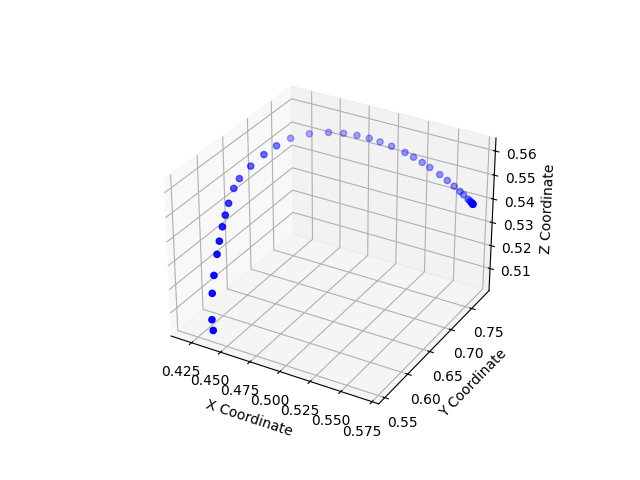

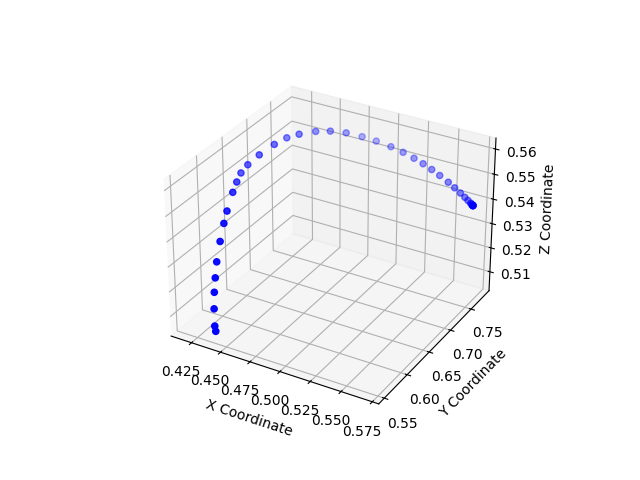

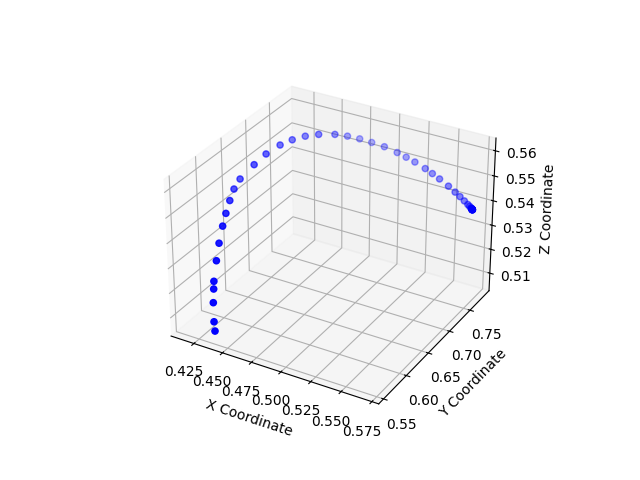

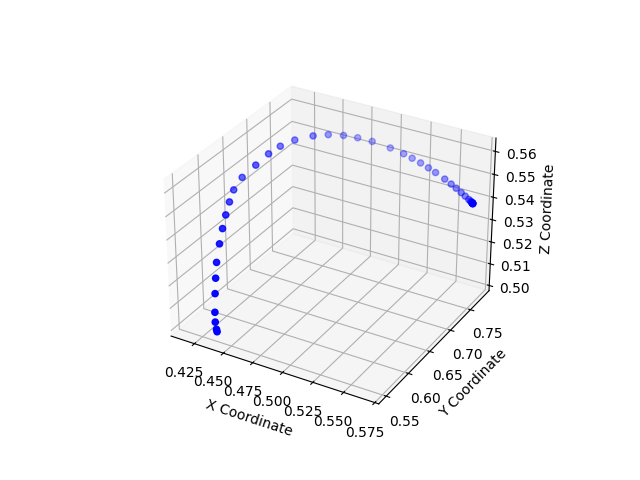

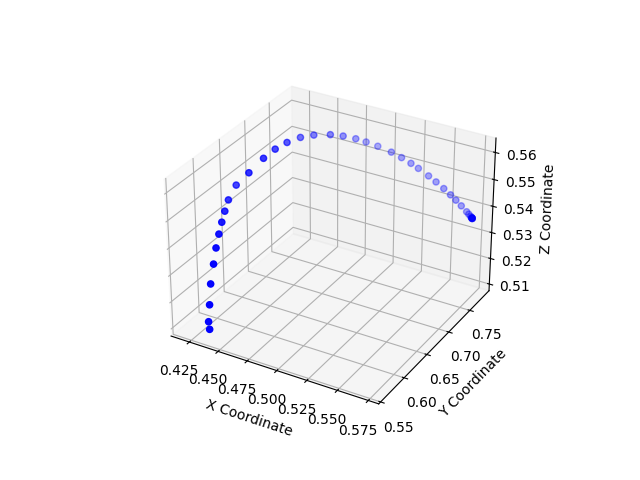

...

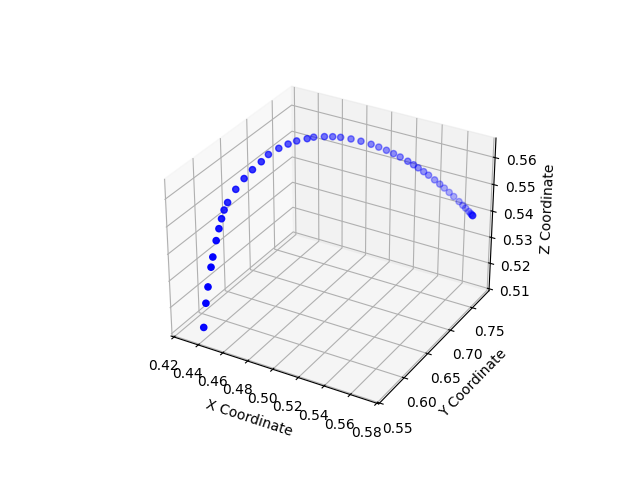

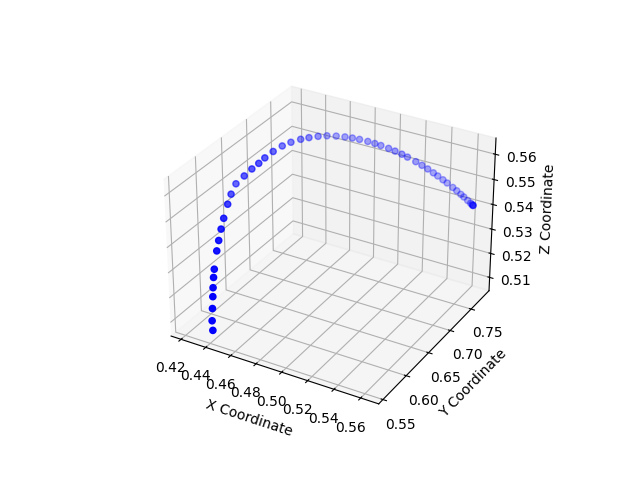

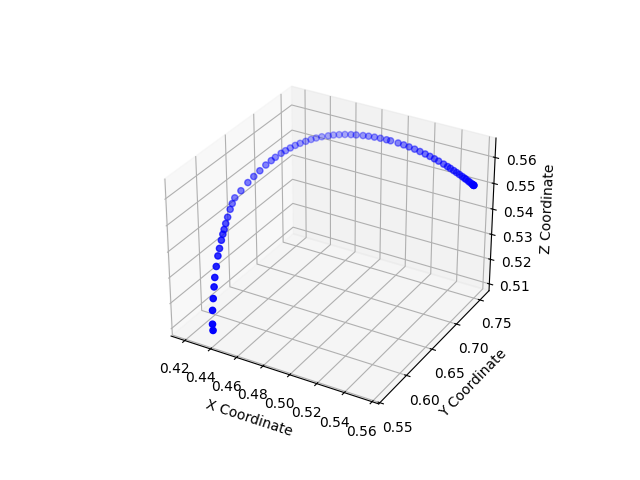

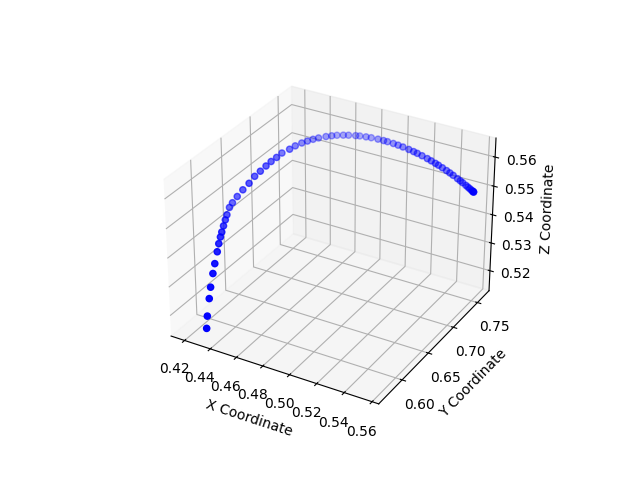

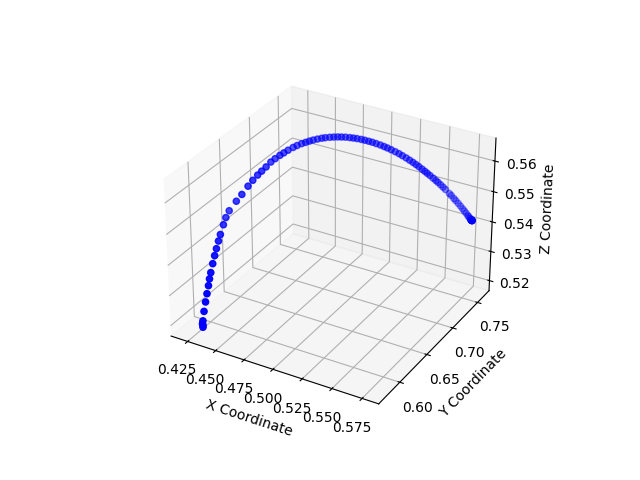

In [1]:
%matplotlib widget
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
Uninjured_er_sheets = pd.read_excel("Uninjured/Uninjured_ER_BigData.xlsx", engine="calamine", sheet_name=None)

for sheet_name, Uninjured_er_df in Uninjured_er_sheets.items():
    fig = plt.figure(f"Uninjured: {sheet_name}")
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(Uninjured_er_df['X'], Uninjured_er_df['Y'], Uninjured_er_df['Z'], c='blue', marker='o')
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.set_zlabel('Z Coordinate')
    plt.show()

### 

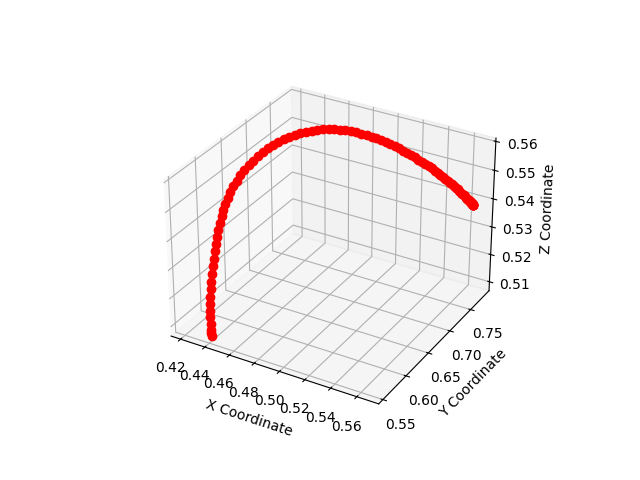

In [2]:
%matplotlib widget
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import interp1d

# Read all sheets from Excel
Uninjured_er_sheets = pd.read_excel("Uninjured/Uninjured_ER_BigData.xlsx", 
                               engine="calamine", 
                               sheet_name=None)

# Decide how many points you want in the "normalized" rep
n_samples = 100

# This list will hold arrays of shape (n_samples, 3) for each rep
all_reps = []

for sheet_name, df in Uninjured_er_sheets.items():
    # Ensure 'X', 'Y', and 'Z' columns exist
    if {'X', 'Y', 'Z'}.issubset(df.columns):
        # Number of points in this sheet (rep)
        n_points = len(df)
        
        # Create a parameter t from 0 to 1 for this rep
        t_original = np.linspace(0, 1, n_points)
        
        # Create interpolation functions for X, Y, and Z
        fX = interp1d(t_original, df['X'], kind='linear')
        fY = interp1d(t_original, df['Y'], kind='linear')
        fZ = interp1d(t_original, df['Z'], kind='linear')
        
        # Resample at n_samples points between 0 and 1
        t_resampled = np.linspace(0, 1, n_samples)
        X_resampled = fX(t_resampled)
        Y_resampled = fY(t_resampled)
        Z_resampled = fZ(t_resampled)
        
        # Stack into shape (n_samples, 3)
        rep_array = np.column_stack((X_resampled, Y_resampled, Z_resampled))
        all_reps.append(rep_array)
    else:
        print(f"Skipping sheet '{sheet_name}' because it doesn't have X, Y, Z columns.")

# Convert the list of reps into a 3D NumPy array of shape (num_reps, n_samples, 3)
all_reps = np.array(all_reps)

# Compute the average across all reps (mean along axis=0), 
# resulting in shape (n_samples, 3)
avg_rep = np.mean(all_reps, axis=0)

# Plot the average rep
fig = plt.figure("Average Uninjured ER Rep")
ax = fig.add_subplot(111, projection='3d')

# You can use plot(...) for a line or scatter(...) for points
ax.plot(avg_rep[:, 0], avg_rep[:, 1], avg_rep[:, 2], c='red', marker='o')

ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Z Coordinate')

plt.show()


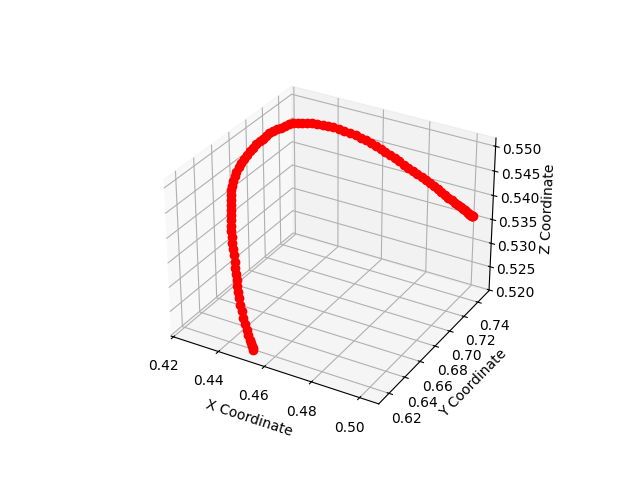

In [3]:
%matplotlib widget
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import interp1d

# Read all sheets from Excel
Uninjured_er_sheets = pd.read_excel("Injured/Injured_ER_BigData.xlsx", 
                               engine="calamine", 
                               sheet_name=None)

# Decide how many points you want in the "normalized" rep
n_samples = 100

# This list will hold arrays of shape (n_samples, 3) for each rep
all_reps = []

for sheet_name, df in Uninjured_er_sheets.items():
    # Ensure 'X', 'Y', and 'Z' columns exist
    if {'X', 'Y', 'Z'}.issubset(df.columns):
        # Number of points in this sheet (rep)
        n_points = len(df)
        
        # Create a parameter t from 0 to 1 for this rep
        t_original = np.linspace(0, 1, n_points)
        
        # Create interpolation functions for X, Y, and Z
        fX = interp1d(t_original, df['X'], kind='linear')
        fY = interp1d(t_original, df['Y'], kind='linear')
        fZ = interp1d(t_original, df['Z'], kind='linear')
        
        # Resample at n_samples points between 0 and 1
        t_resampled = np.linspace(0, 1, n_samples)
        X_resampled = fX(t_resampled)
        Y_resampled = fY(t_resampled)
        Z_resampled = fZ(t_resampled)
        
        # Stack into shape (n_samples, 3)
        rep_array = np.column_stack((X_resampled, Y_resampled, Z_resampled))
        all_reps.append(rep_array)
    else:
        print(f"Skipping sheet '{sheet_name}' because it doesn't have X, Y, Z columns.")

# Convert the list of reps into a 3D NumPy array of shape (num_reps, n_samples, 3)
all_reps = np.array(all_reps)

# Compute the average across all reps (mean along axis=0), 
# resulting in shape (n_samples, 3)
avg_rep = np.mean(all_reps, axis=0)

# Plot the average rep
fig = plt.figure("Average Injured ER Rep")
ax = fig.add_subplot(111, projection='3d')

# You can use plot(...) for a line or scatter(...) for points
ax.plot(avg_rep[:, 0], avg_rep[:, 1], avg_rep[:, 2], c='red', marker='o')

ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Z Coordinate')

plt.show()


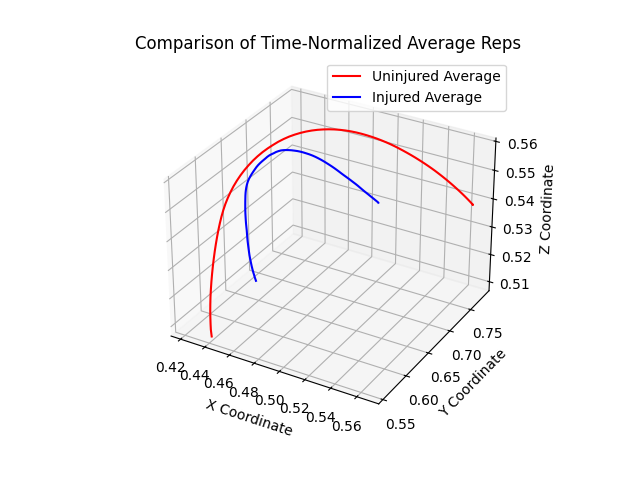

In [4]:
%matplotlib widget
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import interp1d

def compute_average_rep(file_path, n_samples=100):
    """
    Reads all sheets in an Excel file, time-normalizes each rep to n_samples,
    and returns the averaged (X, Y, Z) trajectory as a NumPy array of shape (n_samples, 3).
    """
    # Read all sheets from the given file
    sheets = pd.read_excel(file_path, engine="calamine", sheet_name=None)
    
    all_reps = []  # will store arrays of shape (n_samples, 3) for each rep
    
    for sheet_name, df in sheets.items():
        # Check that the DataFrame has the necessary columns
        if {'X', 'Y', 'Z'}.issubset(df.columns):
            n_points = len(df)
            # Parametrize from 0 to 1
            t_original = np.linspace(0, 1, n_points)
            
            # Create interpolation functions for X, Y, Z
            fX = interp1d(t_original, df['X'], kind='linear')
            fY = interp1d(t_original, df['Y'], kind='linear')
            fZ = interp1d(t_original, df['Z'], kind='linear')
            
            # Resample at n_samples points
            t_resampled = np.linspace(0, 1, n_samples)
            X_resampled = fX(t_resampled)
            Y_resampled = fY(t_resampled)
            Z_resampled = fZ(t_resampled)
            
            rep_array = np.column_stack((X_resampled, Y_resampled, Z_resampled))
            all_reps.append(rep_array)
        else:
            print(f"Skipping sheet '{sheet_name}' because it doesn't have X, Y, Z columns.")

    # Convert to a NumPy array of shape (num_reps, n_samples, 3)
    all_reps = np.array(all_reps)

    # Average across all reps, resulting in shape (n_samples, 3)
    avg_rep = np.mean(all_reps, axis=0)
    
    return avg_rep

# Compute average reps from the two files
Uninjured_avg = compute_average_rep("Uninjured/Uninjured_ER_BigData.xlsx", n_samples=100)
Injured_avg = compute_average_rep("Injured/Injured_ER_BigData.xlsx", n_samples=100)

# Plot the two average reps in the same 3D figure
fig = plt.figure("Comparison of Average Reps")
ax = fig.add_subplot(111, projection='3d')

# Plot Uninjured's average rep (red line)
ax.plot(Uninjured_avg[:, 0], Uninjured_avg[:, 1], Uninjured_avg[:, 2], color='red', label='Uninjured Average')

# Plot Injured's average rep (blue line)
ax.plot(Injured_avg[:, 0], Injured_avg[:, 1], Injured_avg[:, 2], color='blue', label='Injured Average')

# Label the axes
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Z Coordinate')

ax.set_title('Comparison of Time-Normalized Average Reps')
ax.legend()

plt.show()


In [5]:
import numpy as np

def compute_jerk_measure(trajectory):
    """
    trajectory: (N, 3) array of (X, Y, Z) positions 
                time-normalized from t=0 to t=1.
    Returns a scalar representing the integrated jerk magnitude.
    """
    N = trajectory.shape[0]
    
    # Assume uniform time spacing from 0..1
    # dt = total_time / (N-1). If total_time=1, then dt=1/(N-1).
    dt = 1.0 / (N - 1)
    
    # 1) velocity
    vel = np.gradient(trajectory, dt, axis=0)  # shape (N, 3)
    # 2) acceleration
    acc = np.gradient(vel, dt, axis=0)        # shape (N, 3)
    # 3) jerk
    jerk = np.gradient(acc, dt, axis=0)       # shape (N, 3)
    
    # Magnitude of jerk at each sample
    jerk_mag = np.linalg.norm(jerk, axis=1)   # shape (N, )
    
    # Integrate jerk magnitude over the duration 0..1
    # You can also use sum(jerk_mag)*dt as a simpler approximation
    jerk_measure = np.trapz(jerk_mag, dx=dt)
    return jerk_measure

# Suppose you have average reps for Uninjured and Injured as Nx3 arrays
jerk_Uninjured = compute_jerk_measure(Uninjured_avg)
jerk_Injured  = compute_jerk_measure(Injured_avg)

print(f"Uninjured's integrated jerk measure: {jerk_Uninjured:.4f}")
print(f"Injured's integrated jerk measure:  {jerk_Injured:.4f}")


Uninjured's integrated jerk measure: 35.9972
Injured's integrated jerk measure:  34.6264


/tmp/ipykernel_464415/1278134660.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  jerk_measure = np.trapz(jerk_mag, dx=dt)


/tmp/ipykernel_464415/3283637704.py:93: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot([Uninjured_vel_stds, Injured_vel_stds], labels=['Uninjured', 'Injured'])


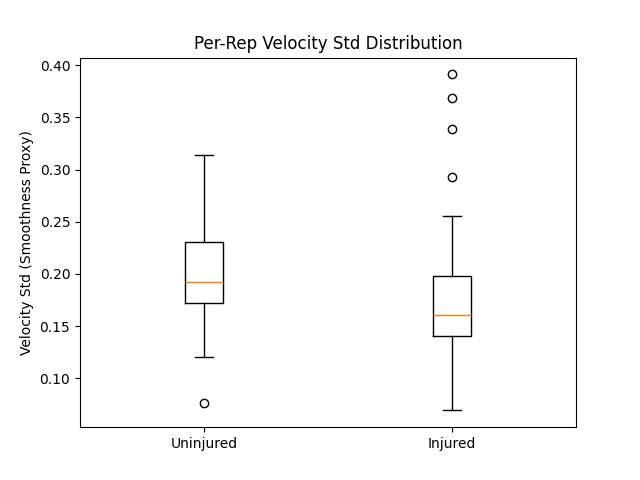

In [6]:
%matplotlib widget
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import interp1d

def time_normalize_rep(df, n_samples=100):
    """
    Given a DataFrame `df` containing columns 'X', 'Y', 'Z' for a single rep,
    returns a time-normalized NumPy array of shape (n_samples, 3).
    """
    # Number of points in the original rep
    n_points = len(df)
    
    # Create a parameter from 0 to 1
    t_original = np.linspace(0, 1, n_points)
    
    # Create interpolation functions for each coordinate
    fX = interp1d(t_original, df['X'], kind='linear')
    fY = interp1d(t_original, df['Y'], kind='linear')
    fZ = interp1d(t_original, df['Z'], kind='linear')
    
    # Resample at n_samples points
    t_resampled = np.linspace(0, 1, n_samples)
    X_resampled = fX(t_resampled)
    Y_resampled = fY(t_resampled)
    Z_resampled = fZ(t_resampled)
    
    # Return (n_samples, 3)
    return np.column_stack((X_resampled, Y_resampled, Z_resampled))

def compute_velocity_std(trajectory):
    """
    Given a time-normalized trajectory of shape (N, 3),
    computes the standard deviation of the velocity magnitude.
    """
    N = trajectory.shape[0]
    if N < 2:
        return np.nan  # Not enough points to compute velocity
    
    # Assume uniform time spacing from 0..1
    dt = 1.0 / (N - 1)
    
    # Approximate velocity using finite differences
    velocity = np.gradient(trajectory, dt, axis=0)  # shape: (N, 3)
    
    # Magnitude of velocity at each sample
    vel_mag = np.linalg.norm(velocity, axis=1)      # shape: (N,)
    
    # Standard deviation of velocity magnitude
    return np.std(vel_mag)

def process_file(file_path, n_samples=100):
    """
    Reads all sheets from `file_path`, time-normalizes each rep (sheet),
    computes velocity std for each, and returns a list of those values.
    """
    sheets = pd.read_excel(file_path, engine="calamine", sheet_name=None)
    
    vel_stds = []
    
    for sheet_name, df in sheets.items():
        # Check for required columns
        if {'X', 'Y', 'Z'}.issubset(df.columns):
            # Time-normalize this rep
            rep_array = time_normalize_rep(df, n_samples=n_samples)
            # Compute velocity std
            v_std = compute_velocity_std(rep_array)
            vel_stds.append(v_std)
        else:
            print(f"Skipping sheet '{sheet_name}' (missing X, Y, or Z).")
    
    return vel_stds

# --- Usage Example ---

# 1) Compute velocity std for each rep in Uninjured's file
Uninjured_vel_stds = process_file("Uninjured/Uninjured_ER_BigData.xlsx", n_samples=100)

# 2) Compute velocity std for each rep in Injured's file
Injured_vel_stds = process_file("Injured/Injured_ER_BigData.xlsx", n_samples=100)

# 3) Compute summary statistics
Uninjured_mean = np.mean(Uninjured_vel_stds)
Uninjured_std  = np.std(Uninjured_vel_stds)

Injured_mean = np.mean(Injured_vel_stds)
Injured_std  = np.std(Injured_vel_stds)

# Optional: visualize the distribution (e.g. boxplot)
fig, ax = plt.subplots()
ax.boxplot([Uninjured_vel_stds, Injured_vel_stds], labels=['Uninjured', 'Injured'])
ax.set_ylabel('Velocity Std (Smoothness Proxy)')
ax.set_title('Per-Rep Velocity Std Distribution')
plt.show()


Uninjured - Mean: 2.1177, SD across reps: 0.5477

Injured - Mean: 1.9500, SD across reps: 0.5482


/tmp/ipykernel_464415/1220364799.py:89: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot([Uninjured_force_rate_stds, Injured_force_rate_stds], labels=['Uninjured', 'Injured'])


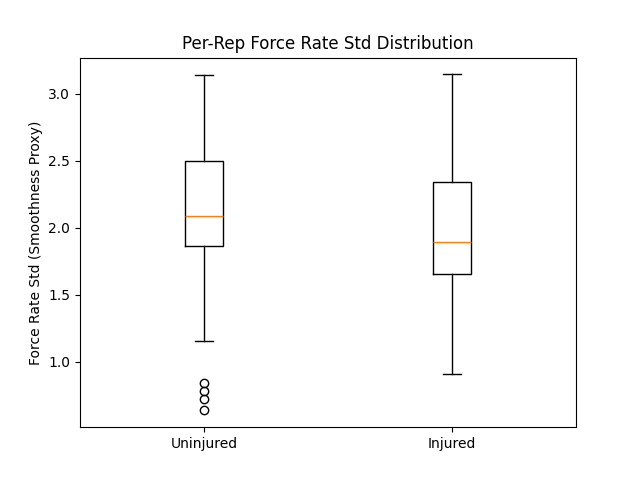

In [7]:
from scipy.interpolate import interp1d
import numpy as np

def time_normalize_force(df, n_samples=100):
    """
    Given a DataFrame `df` with a 'Force' column, returns a time-normalized
    1D NumPy array of shape (n_samples,).
    """
    n_points = len(df)
    if n_points < 2:
        return None  # Not enough points to interpolate
    
    # Parametrize from 0..1
    t_original = np.linspace(0, 1, n_points)
    
    # Interpolate the 'Force' column
    fF = interp1d(t_original, df['Force'], kind='linear')
    
    # Resample
    t_resampled = np.linspace(0, 1, n_samples)
    force_resampled = fF(t_resampled)  # shape (n_samples,)
    
    return force_resampled

def compute_force_rate_std(force_array):
    """
    Given a time-normalized 1D array of Force values (length N),
    computes the standard deviation of the derivative of Force (dF/dt).
    """
    N = len(force_array)
    if N < 2:
        return np.nan
    
    # Time step assuming t in [0,1]
    dt = 1.0 / (N - 1)
    
    # Approximate derivative (Force rate)
    force_rate = np.gradient(force_array, dt)  # shape (N,)
    
    # Standard deviation of the Force rate
    return np.std(force_rate)

import pandas as pd

def process_force_file(file_path, n_samples=100):
    """
    Reads all sheets from `file_path`, time-normalizes the 'Force' column,
    and computes a smoothness measure (Force rate std) for each rep.
    Returns a list of those per-rep values.
    """
    sheets = pd.read_excel(file_path, engine="calamine", sheet_name=None)
    force_rate_stds = []
    
    for sheet_name, df in sheets.items():
        # Check if 'Force' column exists
        if 'Force' in df.columns:
            force_array = time_normalize_force(df, n_samples=n_samples)
            if force_array is not None:
                #fr_std = compute_force_rate_std(force_array)
                fr_std = np.std(force_array)
                force_rate_stds.append(fr_std)
            else:
                print(f"Sheet '{sheet_name}' has too few points to interpolate.")
        else:
            print(f"Sheet '{sheet_name}' missing 'Force' column. Skipping.")
    
    return force_rate_stds

import numpy as np
import matplotlib.pyplot as plt

# 1) Process each file
Uninjured_force_rate_stds = process_force_file("Uninjured/Uninjured_ER_BigData.xlsx", n_samples=100)
Injured_force_rate_stds  = process_force_file("Injured/Injured_ER_BigData.xlsx", n_samples=100)

# 2) Summary statistics
Uninjured_mean = np.mean(Uninjured_force_rate_stds)
Uninjured_std  = np.std(Uninjured_force_rate_stds)

Injured_mean = np.mean(Injured_force_rate_stds)
Injured_std  = np.std(Injured_force_rate_stds)

print(f"Uninjured - Mean: {Uninjured_mean:.4f}, SD across reps: {Uninjured_std:.4f}\n")

print(f"Injured - Mean: {Injured_mean:.4f}, SD across reps: {Injured_std:.4f}")

# 3) Boxplot comparison
fig, ax = plt.subplots()
ax.boxplot([Uninjured_force_rate_stds, Injured_force_rate_stds], labels=['Uninjured', 'Injured'])
ax.set_ylabel('Force Rate Std (Smoothness Proxy)')
ax.set_title('Per-Rep Force Rate Std Distribution')
plt.show()



In [8]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d

def time_normalize_force(df, n_samples=100):
    n_points = len(df)
    if n_points < 2:
        return None
    
    t_original = np.linspace(0, 1, n_points)
    fF = interp1d(t_original, df['Force'], kind='linear')
    
    t_resampled = np.linspace(0, 1, n_samples)
    force_resampled = fF(t_resampled)
    return force_resampled

def extract_force_features(force_array):
    """
    force_array: 1D array of time-normalized Force data
    returns (peak_force, time_to_peak)
    """
    peak_idx = np.argmax(force_array)
    peak_force = force_array[peak_idx]
    # Convert index to a fraction of total time [0..1]
    time_to_peak = peak_idx / (len(force_array) - 1)
    return peak_force, time_to_peak

def process_file_for_features(file_path, n_samples=100):
    sheets = pd.read_excel(file_path, engine="calamine", sheet_name=None)
    peaks = []
    times = []
    
    for sheet_name, df in sheets.items():
        if 'Force' in df.columns:
            f_arr = time_normalize_force(df, n_samples=n_samples)
            if f_arr is not None:
                pf, ttp = extract_force_features(f_arr)
                peaks.append(pf)
                times.append(ttp)
        else:
            print(f"Skipping {sheet_name} (no Force column).")
    
    return np.array(peaks), np.array(times)

# Example usage for Uninjured and Injured:
Uninjured_peaks, Uninjured_times = process_file_for_features("Uninjured/Uninjured_ER_BigData.xlsx")
Injured_peaks, Injured_times   = process_file_for_features("Injured/Injured_ER_BigData.xlsx")

# Now compare distributions of peak force and time to peak:
print("Uninjured Peak Force stats:", np.mean(Uninjured_peaks), np.std(Uninjured_peaks))
print("Injured Peak Force stats:", np.mean(Injured_peaks),  np.std(Injured_peaks))

print("Uninjured Time to Peak stats:", np.mean(Uninjured_times), np.std(Uninjured_times))
print("Injured Time to Peak stats:", np.mean(Injured_times),  np.std(Injured_times))


Uninjured Peak Force stats: 7.060513285155572 1.0689060780114197
Injured Peak Force stats: 6.5918227552256985 1.3896352649081045
Uninjured Time to Peak stats: 0.374534821903243 0.09976321261447416
Injured Time to Peak stats: 0.44484848484848494 0.14282071044175865


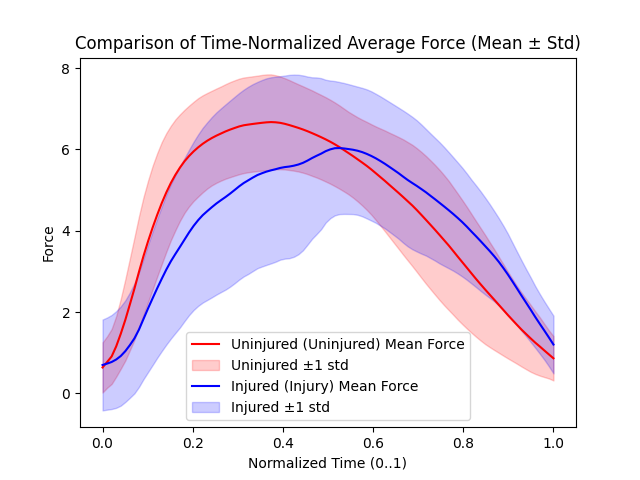

In [9]:
%matplotlib widget
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

def time_normalize_force(df, n_samples=100):
    """
    Given a DataFrame `df` with a 'Force' column, returns a 1D array of length n_samples
    representing the time-normalized Force data from t=0..1.
    """
    if 'Force' not in df.columns:
        return None
    
    n_points = len(df)
    if n_points < 2:
        return None  # Not enough data to interpolate
    
    # Original time parameter from 0..1
    t_original = np.linspace(0, 1, n_points)
    
    # Interpolation function for Force
    f_force = interp1d(t_original, df['Force'], kind='linear')
    
    # Resample to n_samples points in [0, 1]
    t_resampled = np.linspace(0, 1, n_samples)
    force_resampled = f_force(t_resampled)  # shape: (n_samples,)
    
    return force_resampled

def read_time_normalized_forces(file_path, n_samples=100):
    """
    Reads all sheets from the given Excel file, time-normalizes the 'Force' column
    in each sheet to n_samples points, and returns a 2D array of shape (num_reps, n_samples).
    """
    # Read all sheets as a dict of {sheet_name: DataFrame}
    sheets = pd.read_excel(file_path, engine="calamine", sheet_name=None)
    
    all_forces = []
    for sheet_name, df in sheets.items():
        # Time-normalize the Force data in this sheet
        force_array = time_normalize_force(df, n_samples=n_samples)
        if force_array is not None:
            all_forces.append(force_array)
        else:
            print(f"Skipping sheet '{sheet_name}' (no Force column or insufficient data).")
    
    if len(all_forces) == 0:
        print(f"No valid Force data found in {file_path}.")
        return None
    
    # Convert list of 1D arrays into a 2D array: (num_reps, n_samples)
    return np.array(all_forces)

# -------------------------------
# Main: Compute and Plot Mean ± Std
# -------------------------------

# 1. Read time-normalized forces for each file
n_samples = 100
Uninjured_forces = read_time_normalized_forces("Uninjured/Uninjured_ER_BigData.xlsx", n_samples=n_samples)
Injured_forces  = read_time_normalized_forces("Injured/Injured_ER_BigData.xlsx", n_samples=n_samples)

# 2. If both datasets loaded, compute mean & std at each time point
if Uninjured_forces is not None and Injured_forces is not None:
    # (num_reps, n_samples) -> mean, std across axis=0 -> shape (n_samples,)
    Uninjured_mean = np.mean(Uninjured_forces, axis=0)
    Uninjured_std  = np.std(Uninjured_forces, axis=0)
    
    Injured_mean = np.mean(Injured_forces, axis=0)
    Injured_std  = np.std(Injured_forces, axis=0)
    
    # 3. Create time axis from 0..1
    t = np.linspace(0, 1, n_samples)
    
    # 4. Plot Mean ± Std for both
    plt.figure("Comparison of Time-Normalized Average Force ± Std")
    plt.clf()
    
    # Uninjured: mean (red line), std fill
    plt.plot(t, Uninjured_mean, color='red', label='Uninjured (Uninjured) Mean Force')
    plt.fill_between(t, Uninjured_mean - Uninjured_std, Uninjured_mean + Uninjured_std,
                     color='red', alpha=0.2, label='Uninjured ±1 std')
    
    # Injured: mean (blue line), std fill
    plt.plot(t, Injured_mean, color='blue', label='Injured (Injury) Mean Force')
    plt.fill_between(t, Injured_mean - Injured_std, Injured_mean + Injured_std,
                     color='blue', alpha=0.2, label='Injured ±1 std')
    
    plt.xlabel('Normalized Time (0..1)')
    plt.ylabel('Force')
    plt.title('Comparison of Time-Normalized Average Force (Mean ± Std)')
    plt.legend()
    plt.show()


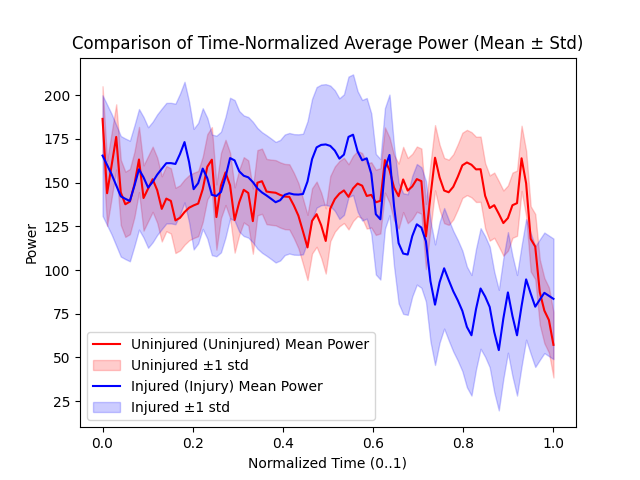

In [21]:
%matplotlib widget
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

def time_normalize_power(df, n_samples=100):
    """
    Given a DataFrame `df` with a 'Power' column, returns a 1D array of length n_samples
    representing the time-normalized power data from t=0..1.
    """
    if 'Power' not in df.columns:
        return None
    
    n_points = len(df)
    if n_points < 2:
        return None  # Not enough data to interpolate
    
    # Original time parameter from 0..1
    t_original = np.linspace(0, 1, n_points)
    
    # Interpolation function for Power
    f_power = interp1d(t_original, df['Power'], kind='linear')
    
    # Resample to n_samples points in [0, 1]
    t_resampled = np.linspace(0, 1, n_samples)
    power_resampled = f_power(t_resampled)  # shape: (n_samples,)
    
    return power_resampled

def read_time_normalized_powers(file_path, n_samples=100):
    """
    Reads all sheets from the given Excel file, time-normalizes the 'Power' column
    in each sheet to n_samples points, and returns a 2D array of shape (num_reps, n_samples).
    """
    # Read all sheets as a dict of {sheet_name: DataFrame}
    sheets = pd.read_excel(file_path, engine="calamine", sheet_name=None)
    
    all_powers = []
    for sheet_name, df in sheets.items():
        # Time-normalize the Power data in this sheet
        power_array = time_normalize_power(df, n_samples=n_samples)
        if power_array is not None:
            all_powers.append(power_array)
        else:
            print(f"Skipping sheet '{sheet_name}' (no  column or insufficient data).")
    
    if len(all_powers) == 0:
        print(f"No valid  data found in {file_path}.")
        return None
    
    # Convert list of 1D arrays into a 2D array: (num_reps, n_samples)
    return np.array(all_powers)

# -------------------------------
# Main: Compute and Plot Mean ± Std
# -------------------------------

# 1. Read time-normalized powers for each file
n_samples = 100
Uninjured_powers = read_time_normalized_powers("Uninjured/Uninjured_ER_Analysis.xlsx", n_samples=n_samples)
Injured_powers  = read_time_normalized_powers("Injured/Injured_ER_Analysis.xlsx", n_samples=n_samples)

# 2. If both datasets loaded, compute mean & std at each time point
if Uninjured_powers is not None and Injured_powers is not None:
    # (num_reps, n_samples) -> mean, std across axis=0 -> shape (n_samples,)
    Uninjured_mean = np.mean(Uninjured_powers, axis=0)
    Uninjured_std  = np.std(Uninjured_powers, axis=1)
    
    Injured_mean = np.mean(Injured_powers, axis=0)
    Injured_std  = np.std(Injured_powers, axis=1)
    
    # 3. Create time axis from 0..1
    t = np.linspace(0, 1, n_samples)
    
    # 4. Plot Mean ± Std for both
    plt.figure("Comparison of Time-Normalized Average Power ± Std")
    plt.clf()
    
    # Uninjured: mean (red line), std fill
    plt.plot(t, Uninjured_mean, color='red', label='Uninjured (Uninjured) Mean Power')
    plt.fill_between(t, Uninjured_mean - Uninjured_std, Uninjured_mean + Uninjured_std,
                     color='red', alpha=0.2, label='Uninjured ±1 std')
    
    # Injured: mean (blue line), std fill
    plt.plot(t, Injured_mean, color='blue', label='Injured (Injury) Mean Power')
    plt.fill_between(t, Injured_mean - Injured_std, Injured_mean + Injured_std,
                     color='blue', alpha=0.2, label='Injured ±1 std')
    
    plt.xlabel('Normalized Time (0..1)')
    plt.ylabel('Power')
    plt.title('Comparison of Time-Normalized Average Power (Mean ± Std)')
    plt.legend()
    plt.show()

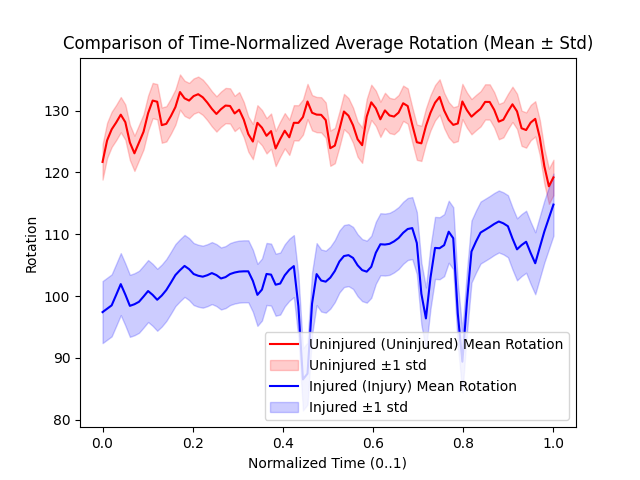

In [20]:
%matplotlib widget
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

def time_normalize_rotation(df, n_samples=100):
    """
    Given a DataFrame `df` with a 'Rotation' column, returns a 1D array of length n_samples
    representing the time-normalized rotation data from t=0..1.
    """
    if 'Rotation' not in df.columns:
        return None
    
    n_points = len(df)
    if n_points < 2:
        return None  # Not enough data to interpolate
    
    # Original time parameter from 0..1
    t_original = np.linspace(0, 1, n_points)
    
    # Interpolation function for Rotation
    f_rotation = interp1d(t_original, df['Rotation'], kind='linear')
    
    # Resample to n_samples points in [0, 1]
    t_resampled = np.linspace(0, 1, n_samples)
    rotation_resampled = f_rotation(t_resampled)  # shape: (n_samples,)
    
    return rotation_resampled

def read_time_normalized_rotations(file_path, n_samples=100):
    """
    Reads all sheets from the given Excel file, time-normalizes the 'Rotation' column
    in each sheet to n_samples points, and returns a 2D array of shape (num_reps, n_samples).
    """
    # Read all sheets as a dict of {sheet_name: DataFrame}
    sheets = pd.read_excel(file_path, engine="calamine", sheet_name=None)
    
    all_rotations = []
    for sheet_name, df in sheets.items():
        # Time-normalize the Rotation data in this sheet
        rotation_array = time_normalize_rotation(df, n_samples=n_samples)
        if rotation_array is not None:
            all_rotations.append(rotation_array)
        else:
            print(f"Skipping sheet '{sheet_name}' (no  column or insufficient data).")
    
    if len(all_rotations) == 0:
        print(f"No valid  data found in {file_path}.")
        return None
    
    # Convert list of 1D arrays into a 2D array: (num_reps, n_samples)
    return np.array(all_rotations)

# -------------------------------
# Main: Compute and Plot Mean ± Std
# -------------------------------

# 1. Read time-normalized rotations for each file
n_samples = 100
Uninjured_rotations = read_time_normalized_rotations("Uninjured/Uninjured_ER_Analysis.xlsx", n_samples=n_samples)
Injured_rotations  = read_time_normalized_rotations("Injured/Injured_ER_Analysis.xlsx", n_samples=n_samples)

# 2. If both datasets loaded, compute mean & std at each time point
if Uninjured_rotations is not None and Injured_rotations is not None:
    # (num_reps, n_samples) -> mean, std across axis=0 -> shape (n_samples,)
    Uninjured_mean = np.mean(Uninjured_rotations, axis=0)
    Uninjured_std  = np.std(Uninjured_rotations, axis=1)
    
    Injured_mean = np.mean(Injured_rotations, axis=0)
    Injured_std  = np.std(Injured_rotations, axis=1)
    
    # 3. Create time axis from 0..1
    t = np.linspace(0, 1, n_samples)
    
    # 4. Plot Mean ± Std for both
    plt.figure("Comparison of Time-Normalized Average Rotation ± Std")
    plt.clf()
    
    # Uninjured: mean (red line), std fill
    plt.plot(t, Uninjured_mean, color='red', label='Uninjured (Uninjured) Mean Rotation')
    plt.fill_between(t, Uninjured_mean - Uninjured_std, Uninjured_mean + Uninjured_std,
                     color='red', alpha=0.2, label='Uninjured ±1 std')
    
    # Injured: mean (blue line), std fill
    plt.plot(t, Injured_mean, color='blue', label='Injured (Injury) Mean Rotation')
    plt.fill_between(t, Injured_mean - Injured_std, Injured_mean + Injured_std,
                     color='blue', alpha=0.2, label='Injured ±1 std')
    
    plt.xlabel('Normalized Time (0..1)')
    plt.ylabel('Rotation')
    plt.title('Comparison of Time-Normalized Average Rotation (Mean ± Std)')
    plt.legend()
    plt.show()

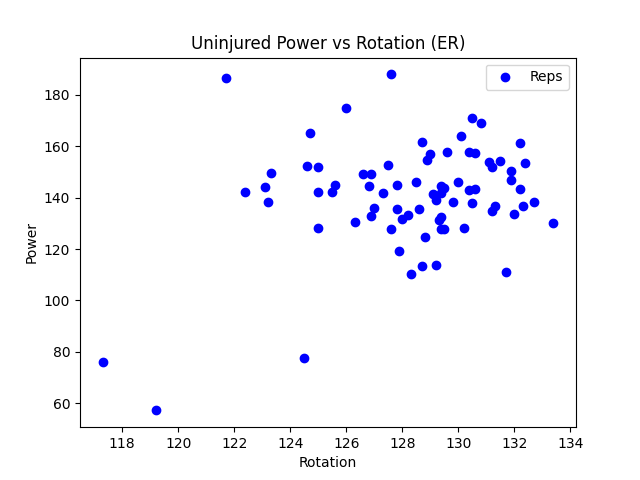

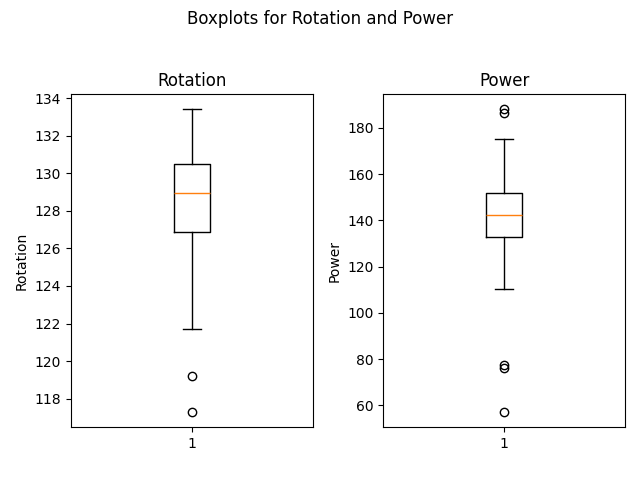

In [12]:
%matplotlib widget
import pandas as pd
import matplotlib.pyplot as plt

# Read only the first sheet from the Excel file.
df = pd.read_excel("Uninjured/Uninjured_ER_Analysis.xlsx", sheet_name=0, engine="calamine")

# ----------------------------
# Scatter Plot: Power vs Rotation
# ----------------------------
plt.figure("Uninjured Power vs Rotation")
plt.clf()

plt.scatter(df["Rotation"], df["Power"], color="blue", label="Reps")
plt.xlabel("Rotation")
plt.ylabel("Power")
plt.title("Uninjured Power vs Rotation (ER)")
plt.legend()
plt.show()

# ----------------------------
# Boxplots: One for Rotation, One for Power
# ----------------------------
plt.figure("Boxplots for Rotation and Power")
plt.clf()

# Create a subplot with two side-by-side plots.
plt.subplot(1, 2, 1)
plt.boxplot(df["Rotation"])
plt.title("Rotation")
plt.ylabel("Rotation")

plt.subplot(1, 2, 2)
plt.boxplot(df["Power"])
plt.title("Power")
plt.ylabel("Power")

plt.suptitle("Boxplots for Rotation and Power")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


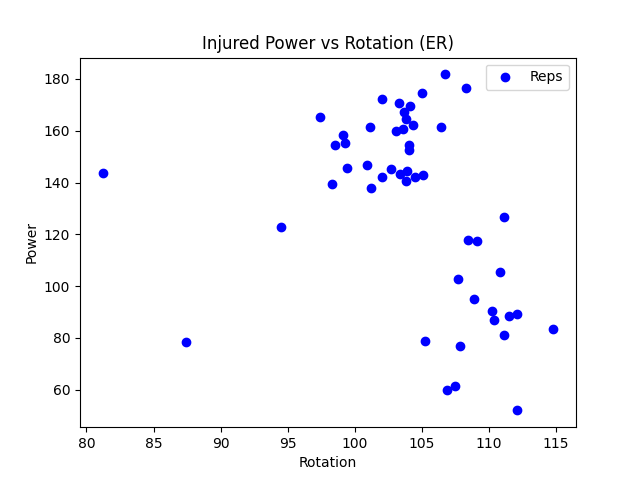

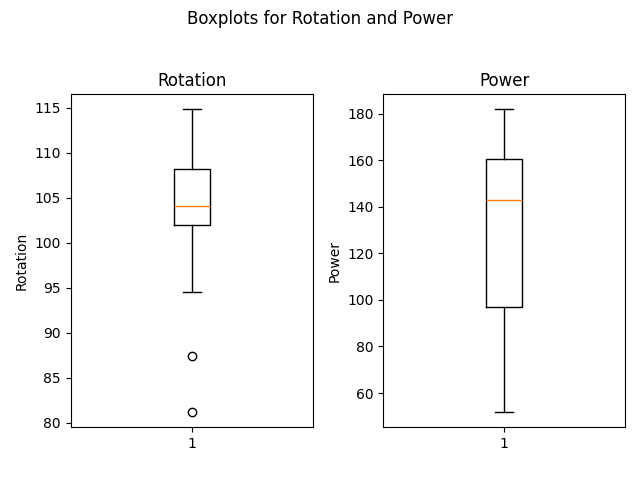

In [13]:
%matplotlib widget
import pandas as pd
import matplotlib.pyplot as plt

# Read only the first sheet from the Excel file.
df = pd.read_excel("Injured/Injured_ER_Analysis.xlsx", sheet_name=0, engine="calamine")

# ----------------------------
# Scatter Plot: Power vs Rotation
# ----------------------------
plt.figure("Injured Power vs Rotation")
plt.clf()

plt.scatter(df["Rotation"], df["Power"], color="blue", label="Reps")
plt.xlabel("Rotation")
plt.ylabel("Power")
plt.title("Injured Power vs Rotation (ER)")
plt.legend()
plt.show()

# ----------------------------
# Boxplots: One for Rotation, One for Power
# ----------------------------
plt.figure("Boxplots for Rotation and Power")
plt.clf()

# Create a subplot with two side-by-side plots.
plt.subplot(1, 2, 1)
plt.boxplot(df["Rotation"])
plt.title("Rotation")
plt.ylabel("Rotation")

plt.subplot(1, 2, 2)
plt.boxplot(df["Power"])
plt.title("Power")
plt.ylabel("Power")

plt.suptitle("Boxplots for Rotation and Power")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


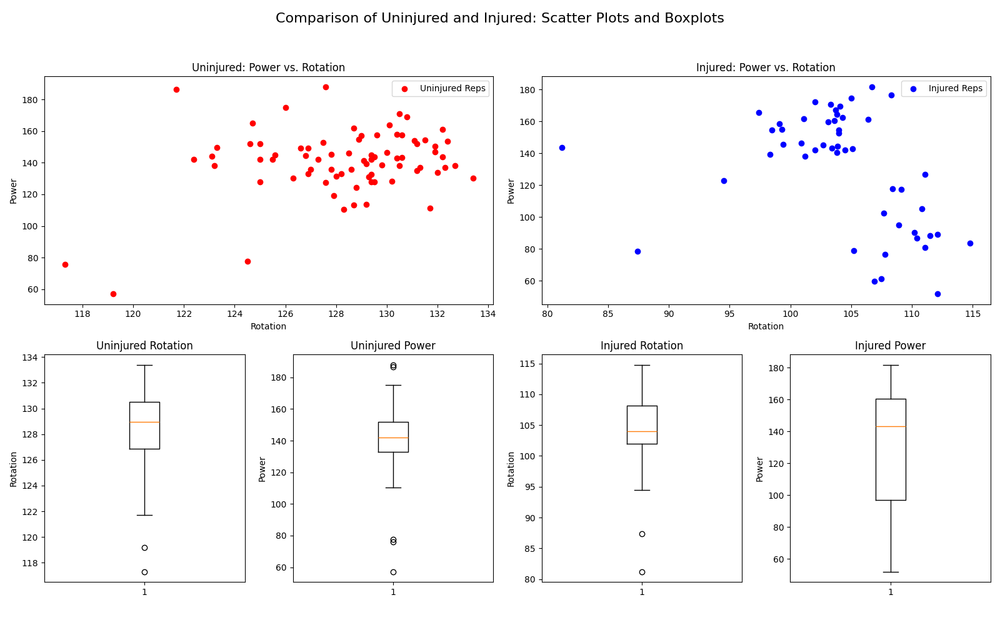

In [14]:
%matplotlib widget
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Read the first sheet from each file.
Uninjured_df = pd.read_excel("Uninjured/Uninjured_ER_Analysis.xlsx", sheet_name=0, engine="calamine")
Injured_df  = pd.read_excel("Injured/Injured_ER_Analysis.xlsx", sheet_name=0, engine="calamine")

# Create a figure with a GridSpec layout.
fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 4, height_ratios=[1, 1])

# --- Top Row: Scatter Plots ---

# Left scatter plot: Uninjured
ax1 = fig.add_subplot(gs[0, 0:2])
ax1.scatter(Uninjured_df["Rotation"], Uninjured_df["Power"], color="red", label="Uninjured Reps")
ax1.set_title("Uninjured: Power vs. Rotation")
ax1.set_xlabel("Rotation")
ax1.set_ylabel("Power")
ax1.legend()

# Right scatter plot: Injured
ax2 = fig.add_subplot(gs[0, 2:4])
ax2.scatter(Injured_df["Rotation"], Injured_df["Power"], color="blue", label="Injured Reps")
ax2.set_title("Injured: Power vs. Rotation")
ax2.set_xlabel("Rotation")
ax2.set_ylabel("Power")
ax2.legend()

# --- Bottom Row: Boxplots ---

# Boxplot for Uninjured Rotation
ax3 = fig.add_subplot(gs[1, 0])
ax3.boxplot(Uninjured_df["Rotation"])
ax3.set_title("Uninjured Rotation")
ax3.set_ylabel("Rotation")

# Boxplot for Uninjured Power
ax4 = fig.add_subplot(gs[1, 1])
ax4.boxplot(Uninjured_df["Power"])
ax4.set_title("Uninjured Power")
ax4.set_ylabel("Power")

# Boxplot for Injured Rotation
ax5 = fig.add_subplot(gs[1, 2])
ax5.boxplot(Injured_df["Rotation"])
ax5.set_title("Injured Rotation")
ax5.set_ylabel("Rotation")

# Boxplot for Injured Power
ax6 = fig.add_subplot(gs[1, 3])
ax6.boxplot(Injured_df["Power"])
ax6.set_title("Injured Power")
ax6.set_ylabel("Power")

fig.suptitle("Comparison of Uninjured and Injured: Scatter Plots and Boxplots", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
